In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_excel("C:/Users/GALDIN/Desktop/Data Science/data set/final project/task2/E Commerce Dataset.xlsx",sheet_name='E Comm')
df_details=pd.read_excel("C:/Users/GALDIN/Desktop/Data Science/data set/final project/task2/E Commerce Dataset.xlsx",sheet_name='Data Dict')


In [3]:
df_details.columns
df_details.drop(['Unnamed: 0', 'Unnamed: 1'],axis=1,inplace=True)
df_details.columns=['Label','Description']
df_details.drop(0,axis=0,inplace=True)
df_details

,Label,Description
1,CustomerID,Unique customer ID
2,Churn,Churn Flag
3,Tenure,Tenure of customer in organization
4,PreferredLoginDevice,Preferred login device of customer
5,CityTier,City tier
6,WarehouseToHome,Distance in between warehouse to home of customer
7,PreferredPaymentMode,Preferred payment method of customer
8,Gender,Gender of customer
9,HourSpendOnApp,Number of hours spend on mobile application or...
10,NumberOfDeviceRegistered,Total number of deceives is registered on part...


In [4]:
df.head()

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,159.93
1,50002,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,120.90
2,50003,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120.28
3,50004,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134.07
4,50005,1,0.0,Phone,1,12.0,CC,Male,NaN,3,Mobile,5,Single,3,0,11.0,1.0,1.0,3.0,129.60


In [5]:
df.drop('CustomerID',axis = 1,inplace=True)

In [6]:
df.shape

(5630, 19)

In [7]:
df.Churn.value_counts()

Churn
0    4682
1     948
Name: count, dtype: int64

In [8]:
df.isna().sum()

Churn                            0
Tenure                         264
PreferredLoginDevice             0
CityTier                         0
WarehouseToHome                251
PreferredPaymentMode             0
Gender                           0
HourSpendOnApp                 255
NumberOfDeviceRegistered         0
PreferedOrderCat                 0
SatisfactionScore                0
MaritalStatus                    0
NumberOfAddress                  0
Complain                         0
OrderAmountHikeFromlastYear    265
CouponUsed                     256
OrderCount                     258
DaySinceLastOrder              307
CashbackAmount                   0
dtype: int64

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Churn                        5630 non-null   int64  
 1   Tenure                       5366 non-null   float64
 2   PreferredLoginDevice         5630 non-null   object 
 3   CityTier                     5630 non-null   int64  
 4   WarehouseToHome              5379 non-null   float64
 5   PreferredPaymentMode         5630 non-null   object 
 6   Gender                       5630 non-null   object 
 7   HourSpendOnApp               5375 non-null   float64
 8   NumberOfDeviceRegistered     5630 non-null   int64  
 9   PreferedOrderCat             5630 non-null   object 
 10  SatisfactionScore            5630 non-null   int64  
 11  MaritalStatus                5630 non-null   object 
 12  NumberOfAddress              5630 non-null   int64  
 13  Complain          

In [10]:
df.describe()

,Churn,Tenure,CityTier,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
count,5630.000000,5366.000000,5630.000000,5379.000000,5375.000000,5630.000000,5630.000000,5630.000000,5630.000000,5365.000000,5374.000000,5372.000000,5323.000000,5630.000000
mean,0.168384,10.189899,1.654707,15.639896,2.931535,3.688988,3.066785,4.214032,0.284902,15.707922,1.751023,3.008004,4.543491,177.223030
std,0.374240,8.557241,0.915389,8.531475,0.721926,1.023999,1.380194,2.583586,0.451408,3.675485,1.894621,2.939680,3.654433,49.207036
min,0.000000,0.000000,1.000000,5.000000,0.000000,1.000000,1.000000,1.000000,0.000000,11.000000,0.000000,1.000000,0.000000,0.000000
25%,0.000000,2.000000,1.000000,9.000000,2.000000,3.000000,2.000000,2.000000,0.000000,13.000000,1.000000,1.000000,2.000000,145.770000
50%,0.000000,9.000000,1.000000,14.000000,3.000000,4.000000,3.000000,3.000000,0.000000,15.000000,1.000000,2.000000,3.000000,163.280000
75%,0.000000,16.000000,3.000000,20.000000,3.000000,4.000000,4.000000,6.000000,1.000000,18.000000,2.000000,3.000000,7.000000,196.392500
max,1.000000,61.000000,3.000000,127.000000,5.000000,6.000000,5.000000,22.000000,1.000000,26.000000,16.000000,16.000000,46.000000,324.990000


In [11]:
df.describe(include='O')

,PreferredLoginDevice,PreferredPaymentMode,Gender,PreferedOrderCat,MaritalStatus
count,5630,5630,5630,5630,5630
unique,3,7,2,6,3
top,Mobile Phone,Debit Card,Male,Laptop & Accessory,Married
freq,2765,2314,3384,2050,2986


In [12]:
obj_col = df.select_dtypes(include=['object']).columns

for col in obj_col:
    unique_values = df[col].unique()
    print(f"Unique values for {col}:\n{unique_values}\n")


Unique values for PreferredLoginDevice:
['Mobile Phone' 'Phone' 'Computer']

Unique values for PreferredPaymentMode:
['Debit Card' 'UPI' 'CC' 'Cash on Delivery' 'E wallet' 'COD' 'Credit Card']

Unique values for Gender:
['Female' 'Male']

Unique values for PreferedOrderCat:
['Laptop & Accessory' 'Mobile' 'Mobile Phone' 'Others' 'Fashion' 'Grocery']

Unique values for MaritalStatus:
['Single' 'Divorced' 'Married']



In [13]:
df=df.replace('Cash on Delivery','COD')
df=df.replace(['Mobile','Phone'],['Mobile Phone','Mobile Phone'])
df=df.replace('Credit Card','CC')

value_mapping = {
    'Cash on Delivery': 'COD',
    'Mobile': 'Mobile Phone',
    'Phone': 'Mobile Phone',
    'Credit Card': 'CC'
}

df.replace(value_mapping, inplace=True)


In [14]:
catg_col=['PreferredLoginDevice', 'PreferredPaymentMode', 'Gender', 'PreferedOrderCat', 'MaritalStatus', 'Churn',
          'CityTier','HourSpendOnApp', 'NumberOfDeviceRegistered', 'SatisfactionScore', 'Complain']

num_col=['Tenure', 'WarehouseToHome', 'NumberOfAddress', 'OrderAmountHikeFromlastYear',
         'CouponUsed', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount']

# EDA

In [15]:
unique_city_tiers = df['CityTier'].unique()
print("Unique City Tiers:")
print(unique_city_tiers)

unique_coupon_used = df['CouponUsed'].unique()
print("\nUnique Coupon Used:")
print(unique_coupon_used)


Unique City Tiers:
[3 1 2]

Unique Coupon Used:
[ 1.  0.  4.  2.  9.  6. 11. nan  7. 12. 10.  5.  3. 13. 15.  8. 14. 16.]


In [16]:
#catagorical summary
for col in catg_col:
    ratio=(df[col].value_counts()/len(df[col]))*100
    print(pd.DataFrame({col: df[col].value_counts(),'Ratio': ratio}))

                      PreferredLoginDevice      Ratio
PreferredLoginDevice                                 
Mobile Phone                          3996  70.976909
Computer                              1634  29.023091
                      PreferredPaymentMode      Ratio
PreferredPaymentMode                                 
Debit Card                            2314  41.101243
CC                                    1774  31.509769
E wallet                               614  10.905861
COD                                    514   9.129663
UPI                                    414   7.353464
        Gender      Ratio
Gender                   
Male      3384  60.106572
Female    2246  39.893428
                    PreferedOrderCat      Ratio
PreferedOrderCat                               
Mobile Phone                    2080  36.944938
Laptop & Accessory              2050  36.412078
Fashion                          826  14.671403
Grocery                          410   7.282416
Others        

In [17]:
# Display summary statistics and custom quantiles for numerical columns

for col in num_col:
    custom_quantiles = [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 0.95, 0.99]
    
    print(f'\n{col}\n')
    
    summary = df[col].describe(percentiles=custom_quantiles).T
    print(summary)
    print("-" * 40)  



Tenure

count    5366.000000
mean       10.189899
std         8.557241
min         0.000000
10%         1.000000
20%         1.000000
30%         4.000000
40%         6.000000
50%         9.000000
60%        11.000000
70%        14.000000
80%        18.000000
90%        23.000000
95%        27.000000
99%        30.000000
max        61.000000
Name: Tenure, dtype: float64
----------------------------------------

WarehouseToHome

count    5379.000000
mean       15.639896
std         8.531475
min         5.000000
10%         7.000000
20%         8.000000
30%         9.000000
40%        11.000000
50%        14.000000
60%        15.000000
70%        17.000000
80%        23.000000
90%        30.000000
95%        33.000000
99%        35.000000
max       127.000000
Name: WarehouseToHome, dtype: float64
----------------------------------------

NumberOfAddress

count    5630.000000
mean        4.214032
std         2.583586
min         1.000000
10%         2.000000
20%         2.000000
30%     

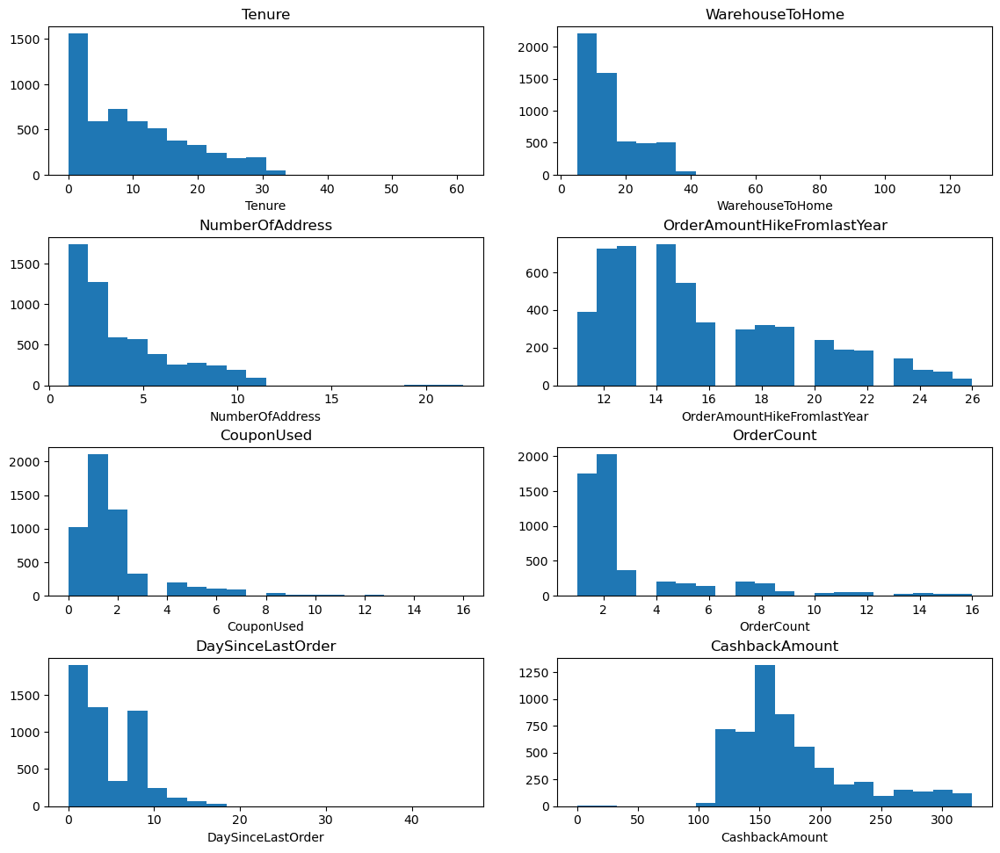

In [18]:
import matplotlib.pyplot as plt

num_columns = len(num_col)
num_rows = (num_columns + 1) // 2  

fig, axs = plt.subplots(num_rows, 2, figsize=(12, 10))
fig.tight_layout(pad=3.0) 

for i, col in enumerate(num_col):
    row, col_num = divmod(i, 2)
    ax = axs[row, col_num]
    ax.hist(df[col], bins=20)
    ax.set_xlabel(col)
    ax.set_title(col)


plt.show()


In [19]:
print(df.groupby('Churn').agg({'WarehouseToHome': 'mean'}))
print(f'\n mean = {df.WarehouseToHome.mean()}')

       WarehouseToHome
Churn                 
0            15.353931
1            17.134259

 mean = 15.639895891429633


In [20]:
#summary of numerical colmns with Churn

for col in num_col:
    print(df.groupby('Churn').agg({col: 'mean'}))

          Tenure
Churn           
0      11.502334
1       3.379469
       WarehouseToHome
Churn                 
0            15.353931
1            17.134259
       NumberOfAddress
Churn                 
0             4.162965
1             4.466245
       OrderAmountHikeFromlastYear
Churn                             
0                        15.724893
1                        15.627409
       CouponUsed
Churn            
0        1.758232
1        1.717021
       OrderCount
Churn            
0        3.046601
1        2.823656
       DaySinceLastOrder
Churn                   
0               4.807406
1               3.236018
       CashbackAmount
Churn                
0          180.635203
1          160.370928


In [21]:
#summary of catagorical colms with churn

for col in catg_col:
    print(col)
    print(pd.DataFrame({
        'Churn percentage': df.groupby(col)['Churn'].mean()*100,
        'Count ': df[col].value_counts(),
    }))
    


PreferredLoginDevice
                      Churn percentage  Count 
PreferredLoginDevice                          
Computer                     19.828641    1634
Mobile Phone                 15.615616    3996
PreferredPaymentMode
                      Churn percentage  Count 
PreferredPaymentMode                          
CC                           14.205186    1774
COD                          24.902724     514
Debit Card                   15.384615    2314
E wallet                     22.801303     614
UPI                          17.391304     414
Gender
        Churn percentage  Count 
Gender                          
Female         15.494212    2246
Male           17.730496    3384
PreferedOrderCat
                    Churn percentage  Count 
PreferedOrderCat                            
Fashion                    15.496368     826
Grocery                     4.878049     410
Laptop & Accessory         10.243902    2050
Mobile Phone               27.403846    2080
Others         

# Data Cleaning


In [22]:
df.isna().sum()

Churn                            0
Tenure                         264
PreferredLoginDevice             0
CityTier                         0
WarehouseToHome                251
PreferredPaymentMode             0
Gender                           0
HourSpendOnApp                 255
NumberOfDeviceRegistered         0
PreferedOrderCat                 0
SatisfactionScore                0
MaritalStatus                    0
NumberOfAddress                  0
Complain                         0
OrderAmountHikeFromlastYear    265
CouponUsed                     256
OrderCount                     258
DaySinceLastOrder              307
CashbackAmount                   0
dtype: int64

In [23]:
missin_col=['Tenure','WarehouseToHome','HourSpendOnApp',
             'OrderAmountHikeFromlastYear', 'CouponUsed', 'OrderCount',
             'DaySinceLastOrder']
for col in missin_col:
    df[col].fillna(df[col].median(),inplace=True)

In [24]:
df=df.loc[~df.duplicated()]

In [25]:
df.reset_index(inplace=True)

In [26]:
def check_outlier(data,col):
    up_lim=data[col].mean()+3*data[col].std()
    low_lim=data[col].mean()-3*data[col].std()
    
    if data[(data[col]>up_lim) | (data[col]<low_lim)].any(axis=None):
        count=data[(data[col] > up_lim) | (data[col] < low_lim)].shape
        
        return count
    else:
        return False

In [27]:
for col in num_col:
    print(col, check_outlier(df, col))

Tenure (4, 20)
WarehouseToHome (2, 20)
NumberOfAddress (4, 20)
OrderAmountHikeFromlastYear False
CouponUsed (105, 20)
OrderCount (165, 20)
DaySinceLastOrder (40, 20)
CashbackAmount (9, 20)


In [28]:
def remove_outliers(data, col_name):
    up_lim=data[col].mean()+3*data[col].std()
    low_lim=data[col].mean()-3*data[col].std()
    
    data = data[(data[col] <= up_lim) & (data[col] >= low_lim)]
    return data

In [29]:
for col in num_col:
    df=remove_outliers(df,col)

# Feature Engineering


In [30]:
numeric_col=num_col+catg_col
numeric_col

['Tenure',
 'WarehouseToHome',
 'NumberOfAddress',
 'OrderAmountHikeFromlastYear',
 'CouponUsed',
 'OrderCount',
 'DaySinceLastOrder',
 'CashbackAmount',
 'PreferredLoginDevice',
 'PreferredPaymentMode',
 'Gender',
 'PreferedOrderCat',
 'MaritalStatus',
 'Churn',
 'CityTier',
 'HourSpendOnApp',
 'NumberOfDeviceRegistered',
 'SatisfactionScore',
 'Complain']

In [31]:
df['avg_cashback']=(df.CashbackAmount/df.OrderCount).round(2)

In [32]:
df_encoded = pd.get_dummies(df,drop_first=True)
df_encoded.drop('index',axis=1,inplace=True)

In [33]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()

In [34]:
scaled_df=scaler.fit_transform(df_encoded,'.2f')

In [35]:
df_encoded[df_encoded.columns] = scaled_df

In [36]:
cf=df_encoded

# Data Visualisation


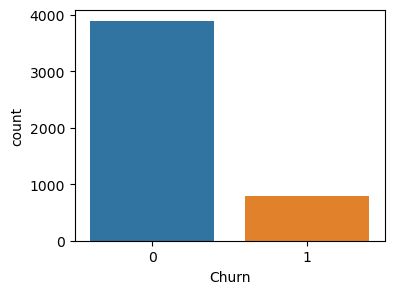

In [37]:
plt.figure(figsize=(4,3))
sns.countplot(x='Churn', data=df)
plt.show()

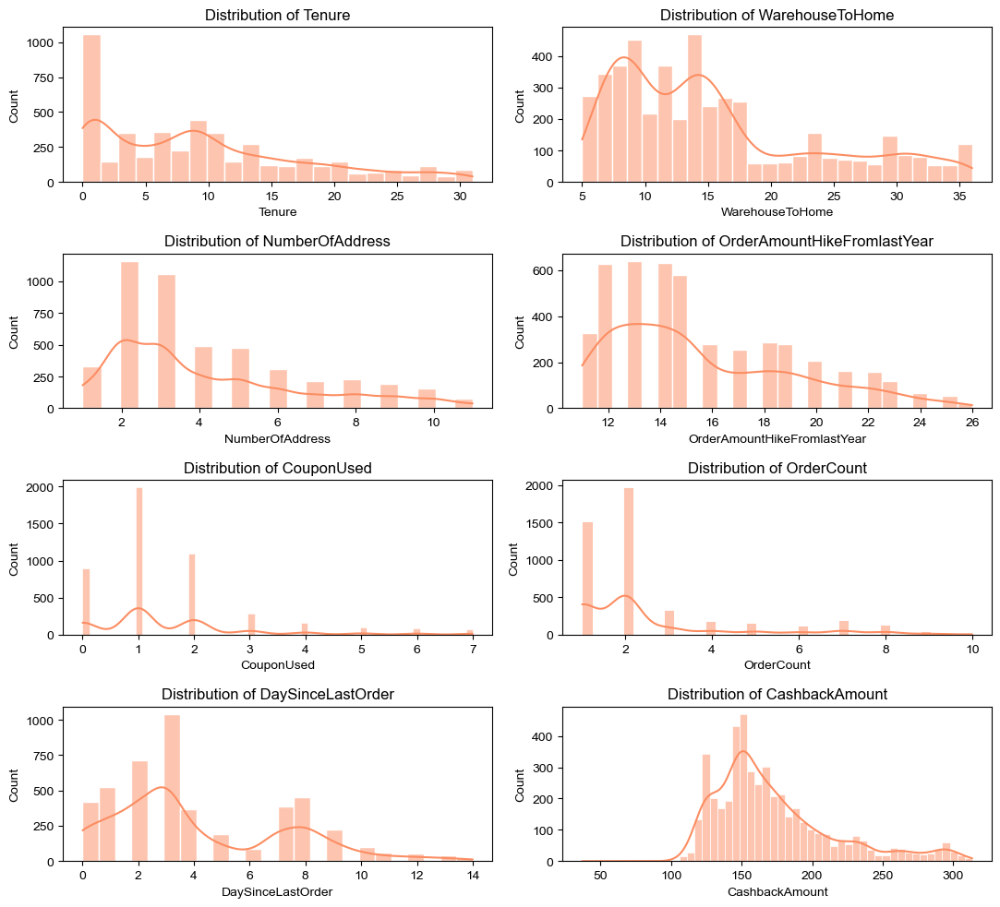

In [38]:

custom_palette = sns.color_palette("Set2")

num_cols = 2
num_rows = (len(num_col) + 1) // num_cols

fig, axs = plt.subplots(num_rows, num_cols, figsize=(11, 10))

for i, col in enumerate(num_col):
    row, col_num = divmod(i, num_cols)
    ax = axs[row, col_num]
    
    sns.set(style="whitegrid")
    
    sns.histplot(x=col, kde=True, data=df, color=custom_palette[1], ax=ax)
    
    ax.set_title(f'Distribution of {col}')
    ax.set_xlabel(col)
    


fig.tight_layout()

plt.show()


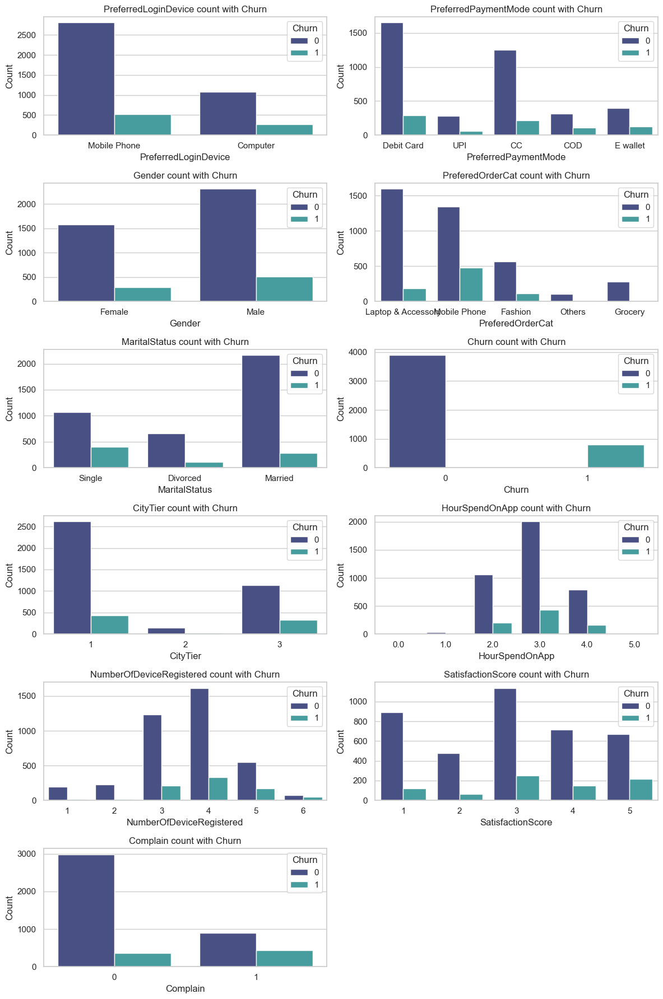

In [39]:
num_cols = len(catg_col)

num_rows = (num_cols + 1) // 2  
num_cols = min(num_cols, 2)  

plt.figure(figsize=(12, 18))  

for i, col in enumerate(catg_col):
    plt.subplot(num_rows, num_cols, i + 1)  
    
    sns.countplot(x=col, hue='Churn', palette='mako', data=df)
    
    plt.title(f'{col} count with Churn')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.legend(title='Churn', loc='upper right')

plt.tight_layout()  
plt.show()


<Axes: xlabel='SatisfactionScore', ylabel='Tenure'>

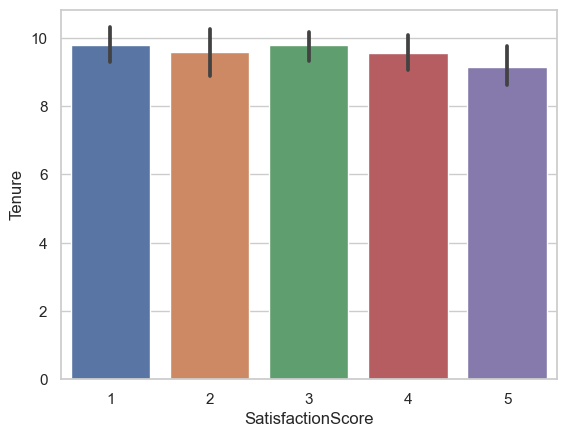

In [40]:
sns.barplot(x='SatisfactionScore', y='Tenure', data=df)

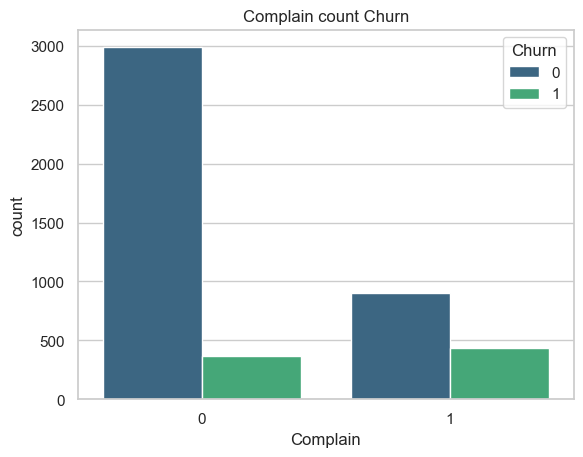

In [41]:
sns.countplot(x='Complain', hue = 'Churn', palette = 'viridis', data = df)
plt.title('Complain count Churn')
plt.show()

Text(0.5, 1.0, 'hour spend on app vs CouponUsed')

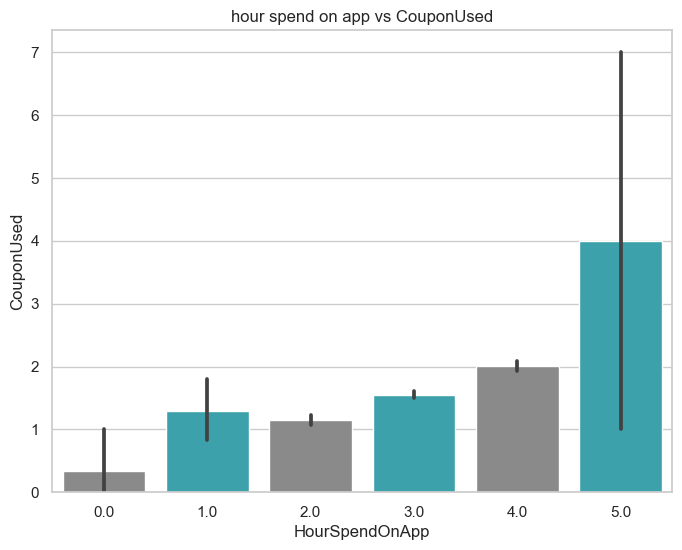

In [42]:
plt.figure(figsize=(8,6))
sns.barplot(data=df,x="HourSpendOnApp",y='CouponUsed',palette=['#8A8A8A','#2AB0BF'])
plt.xlabel('HourSpendOnApp')
plt.ylabel('CouponUsed')
plt.title('hour spend on app vs CouponUsed')

Text(0.5, 1.0, 'OrderCount vs avg_cashback')

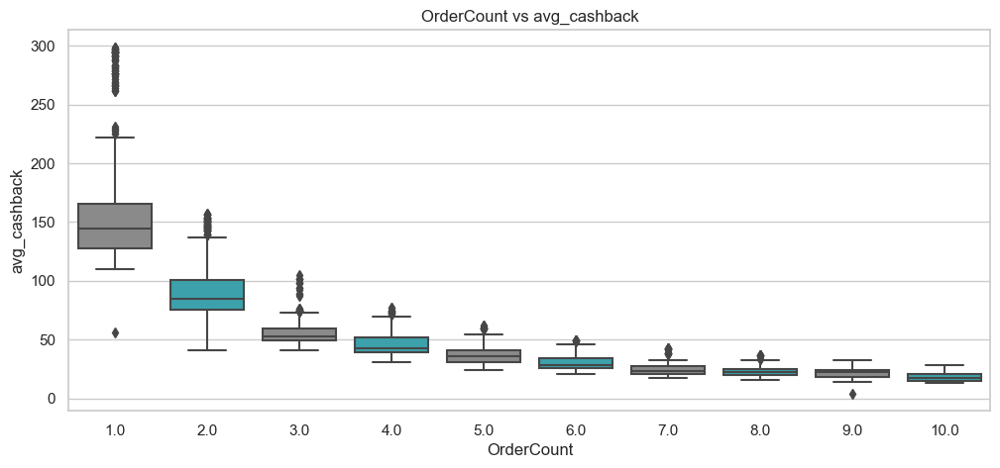

In [43]:
plt.figure(figsize = (12, 5))
sns.boxplot(data=df,x="OrderCount",y='avg_cashback',palette=['#8A8A8A','#2AB0BF'])
plt.xlabel('OrderCount')
plt.ylabel('avg_cashback')
plt.title('OrderCount vs avg_cashback')

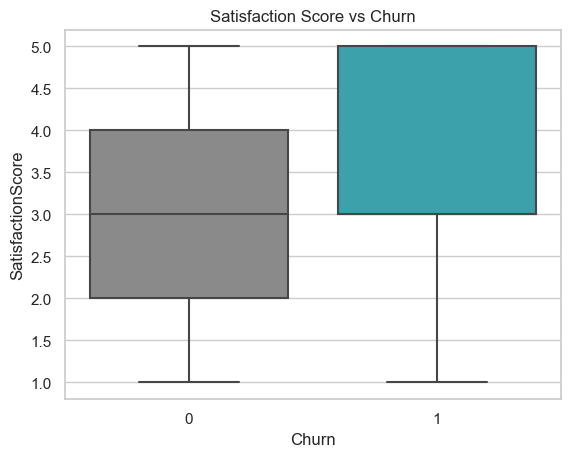

In [44]:
sns.boxplot(data=df, x="Churn", y='SatisfactionScore', palette=['#8A8A8A', '#2AB0BF'])
plt.title("Satisfaction Score vs Churn")
plt.show()

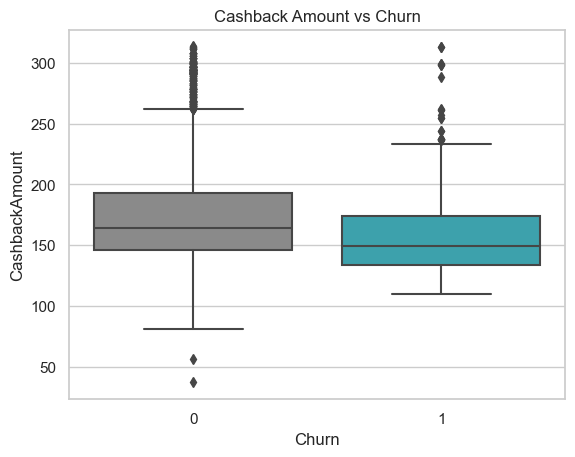

In [45]:
sns.boxplot(data=df, x="Churn", y='CashbackAmount', palette=['#8A8A8A', '#2AB0BF'])
plt.title("Cashback Amount vs Churn")
plt.show()

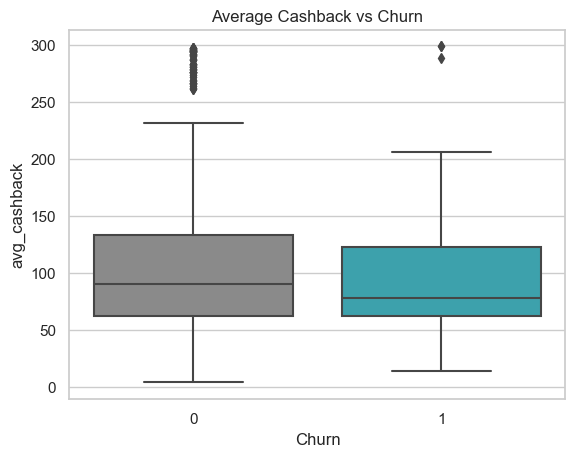

In [46]:
sns.boxplot(data=df, x="Churn", y='avg_cashback', palette=['#8A8A8A', '#2AB0BF'])
plt.title("Average Cashback vs Churn")
plt.show()

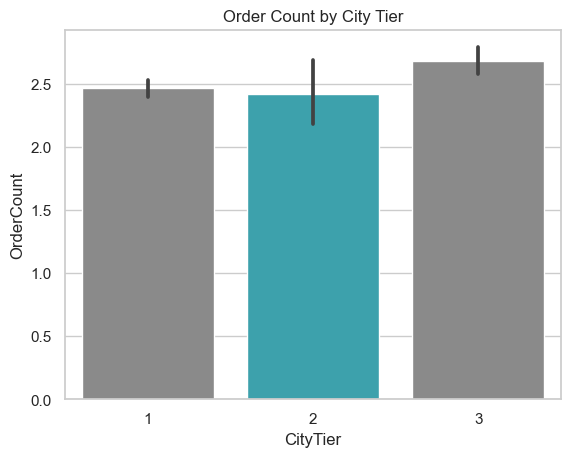

In [47]:
sns.barplot(data=df, x="CityTier", y='OrderCount', palette=['#8A8A8A', '#2AB0BF'])
plt.title("Order Count by City Tier")
plt.show()

<Figure size 5500x700 with 0 Axes>

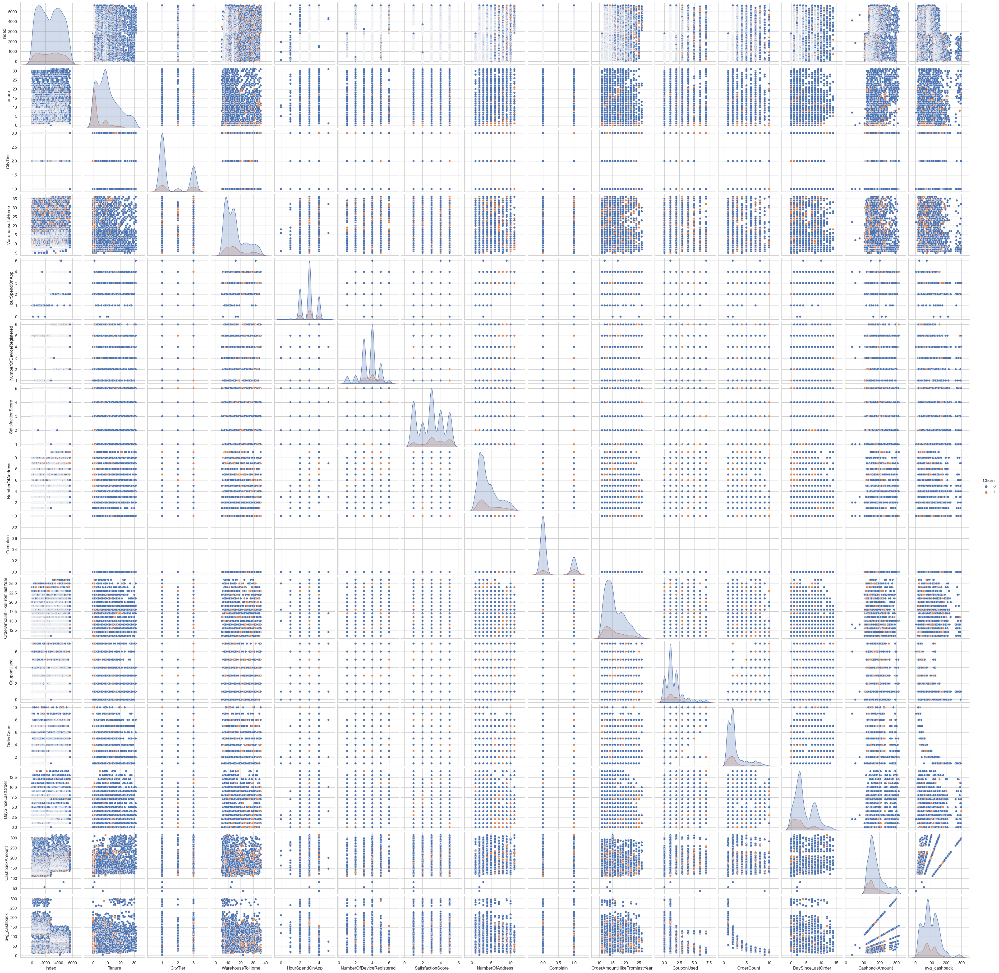

In [51]:
plt.figure(figsize=(55,7))
sns.pairplot(data=df,kind='scatter',hue='Churn')
plt.show()

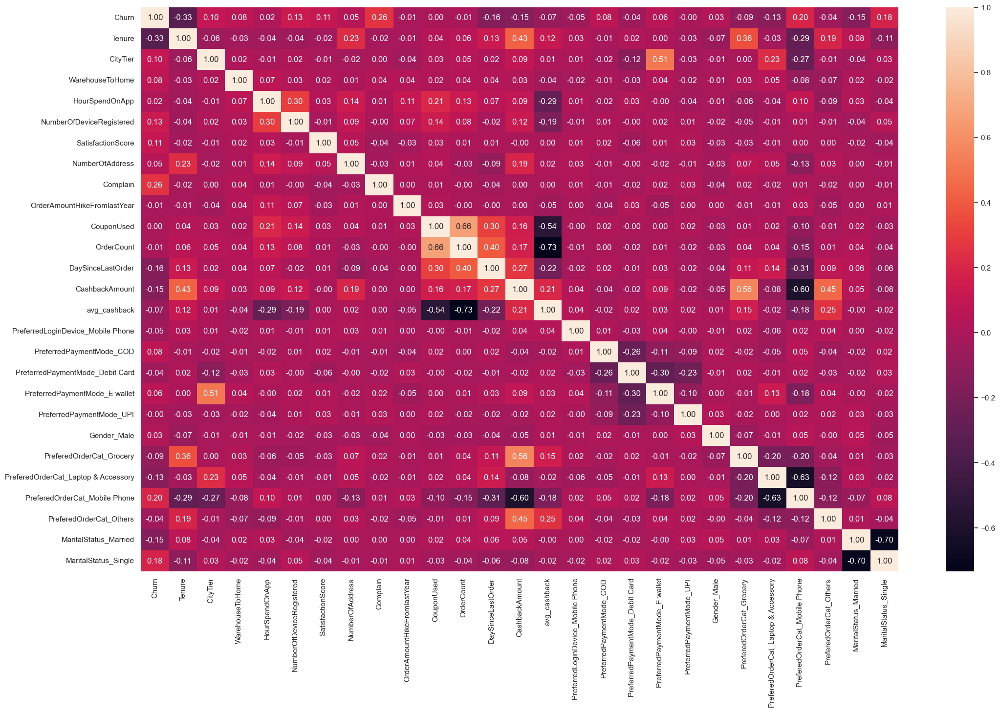

In [52]:
plt.figure(figsize=(25,15))
sns.heatmap(cf.corr(), annot=True, fmt=".2f")
plt.show()

# Feature Selection

In [54]:
X=cf.drop('Churn',axis=1)
Y=cf.Churn

In [55]:
related_feature=[]
corr_mat=X.corr()
for i in range (len(corr_mat)):
    for j in range (i):
        if abs(corr_mat.iloc[i,j])> 0.7:
            col=corr_mat.columns[i]
            related_feature.append(col)

            
related_feature

['avg_cashback', 'MaritalStatus_Single']

In [56]:
cf=cf.drop(['avg_cashback', 'MaritalStatus_Single'],axis=1)
X=X.drop(related_feature,axis=1)

In [57]:
from sklearn.ensemble import ExtraTreesClassifier
model=ExtraTreesClassifier()
model.fit(X,Y)

ExtraTreesClassifier()

In [58]:
print(model.feature_importances_)

[0.14259382 0.03574748 0.06762013 0.03002237 0.04473386 0.06127235
 0.06342683 0.08376032 0.0608425  0.02476261 0.03721017 0.05855875
 0.05555985 0.0333684  0.02036087 0.02626997 0.0157565  0.01246116
 0.03372    0.00476171 0.0212958  0.03422717 0.00237595 0.02929144]


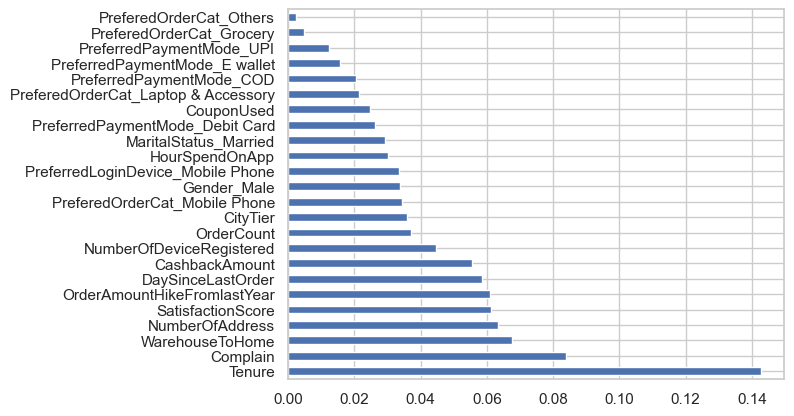

In [59]:
fea_imp=pd.Series(model.feature_importances_,index=X.columns)
fea_imp.nlargest(27).plot(kind='barh')
plt.show()

In [60]:
fea_table=pd.DataFrame(model.feature_importances_, index=X.columns)
fea_table.rename(columns={0:'importance'},inplace=True)
fea_table.sort_values(by='importance', inplace=True)
fea_table

,importance
PreferedOrderCat_Others,0.002376
PreferedOrderCat_Grocery,0.004762
PreferredPaymentMode_UPI,0.012461
PreferredPaymentMode_E wallet,0.015756
PreferredPaymentMode_COD,0.020361
PreferedOrderCat_Laptop & Accessory,0.021296
CouponUsed,0.024763
PreferredPaymentMode_Debit Card,0.026270
MaritalStatus_Married,0.029291
HourSpendOnApp,0.030022


In [61]:
fea_table.index

Index(['PreferedOrderCat_Others', 'PreferedOrderCat_Grocery',
       'PreferredPaymentMode_UPI', 'PreferredPaymentMode_E wallet',
       'PreferredPaymentMode_COD', 'PreferedOrderCat_Laptop & Accessory',
       'CouponUsed', 'PreferredPaymentMode_Debit Card',
       'MaritalStatus_Married', 'HourSpendOnApp',
       'PreferredLoginDevice_Mobile Phone', 'Gender_Male',
       'PreferedOrderCat_Mobile Phone', 'CityTier', 'OrderCount',
       'NumberOfDeviceRegistered', 'CashbackAmount', 'DaySinceLastOrder',
       'OrderAmountHikeFromlastYear', 'SatisfactionScore', 'NumberOfAddress',
       'WarehouseToHome', 'Complain', 'Tenure'],
      dtype='object')

In [62]:
final_df=cf.drop(['PreferedOrderCat_Others', 'PreferedOrderCat_Grocery',
       'PreferredPaymentMode_UPI', 'PreferredPaymentMode_E wallet',
       'PreferredPaymentMode_COD'], axis=1)

In [63]:
x=final_df.drop('Churn',axis=1)
y=final_df.Churn

# Model Selection

In [64]:
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.3)

In [65]:
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix

import lime
from lime import lime_tabular

In [66]:
models={
    'svm': SVC(),
    'KNN' : KNeighborsClassifier(),
    'random forest' : RandomForestClassifier(),
    'XGBoost': XGBClassifier()
}

In [67]:
def evaluate(model,ypred,ypred_train):
    final={
        'model' :model,
        'acc_test' : accuracy_score(ytest,ypred),
        'precision_test' : precision_score(ytest,ypred),
        'rec_test' : recall_score(ytest,ypred),
        'f1_test' : f1_score(ytest,ypred)
    }
    return final

In [68]:
evaluation=[]
for m in models:
    model= models[m].fit(xtrain,ytrain)
    ypred =model.predict(xtest)
    ypred_train=model.predict(xtrain)
    
    result= evaluate(m, ypred,ypred_train)
    evaluation.append(result)

In [69]:
pd.DataFrame(evaluation)

,model,acc_test,precision_test,rec_test,f1_test
0,svm,0.896944,0.822222,0.478448,0.604905
1,KNN,0.889837,0.701571,0.577586,0.633570
2,random forest,0.953092,0.923469,0.780172,0.845794
3,XGBoost,0.955935,0.900943,0.823276,0.860360


In [70]:
models={
    'xgb':{
        'model':XGBClassifier(),
        'params':{
            'learning_rate': [0.1, 0.01, None],
            'max_depth': [5, 8, None],
            'n_estimators': [100, 200, 300],
            'colsample_bytree': [0.5, 1, None]
        }
    }
    
}

In [71]:
scores=[]
for name,mp in models.items():
    grs=GridSearchCV(mp['model'],mp['params'],cv=5,return_train_score=False)
    grs.fit(X,Y)
    scores.append({
        'model': name,
        'best score' : grs.best_score_,
        'best param': grs.best_params_
    })

scores

[{'model': 'xgb',
  'best score': 0.9816631130063966,
  'best param': {'colsample_bytree': 0.5,
   'learning_rate': None,
   'max_depth': 8,
   'n_estimators': 300}}]

In [72]:
xgb=XGBClassifier(colsample_bytree= 0.5,
   max_depth= 8,
   n_estimators= 200)
xgb.fit(xtrain,ytrain)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=200, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [73]:
from sklearn. model_selection import StratifiedKFold, cross_val_score
skf=StratifiedKFold(n_splits=5)
scores=cross_val_score(xgb,X,Y,cv=skf)
np.mean(scores)

0.9810234541577826

In [74]:
feat_importances = pd.DataFrame(xgb.feature_importances_, index=xtrain.columns, columns=['importance'])
feat_imp=feat_importances.sort_values(by='importance', ascending=False)

In [75]:
feat_imp

,importance
Complain,0.164899
Tenure,0.156421
PreferedOrderCat_Mobile Phone,0.087733
PreferedOrderCat_Laptop & Accessory,0.056493
NumberOfAddress,0.055656
DaySinceLastOrder,0.047834
SatisfactionScore,0.044816
MaritalStatus_Married,0.043926
OrderCount,0.040162
PreferredLoginDevice_Mobile Phone,0.039913


<Axes: >

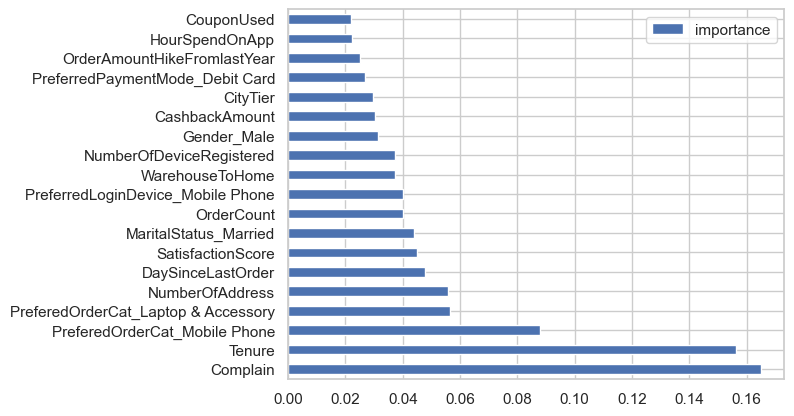

In [76]:
feat_importances.sort_values(by='importance',ascending=False,inplace=True)
feat_importances.plot(kind='barh')

In [77]:
interpretor = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xtrain),
    feature_names=xtrain.columns,
    mode='classification'
)

In [78]:
exp = interpretor.explain_instance(
    data_row=x.iloc[23], ##new data
    predict_fn=xgb.predict_proba
)

exp.show_in_notebook(show_table=True)

In [79]:
report = classification_report(ytest, ypred)
print(report)

              precision    recall  f1-score   support

         0.0       0.97      0.98      0.97      1175
         1.0       0.90      0.82      0.86       232

    accuracy                           0.96      1407
   macro avg       0.93      0.90      0.92      1407
weighted avg       0.96      0.96      0.96      1407



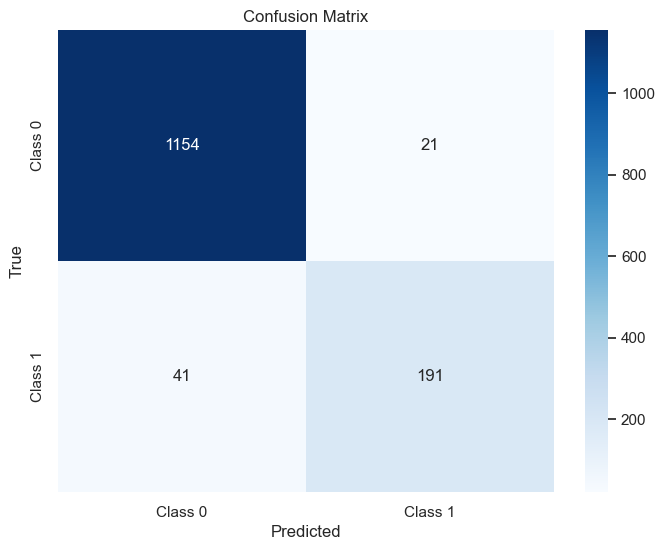

In [80]:
confusion = confusion_matrix(ytest, ypred)

plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [81]:
import pickle
pickle.dump(xgb,open('model.pkl','wb'))
pickle.dump(scaler,open('scaler.pkl','wb'))

# Customer Segmentation

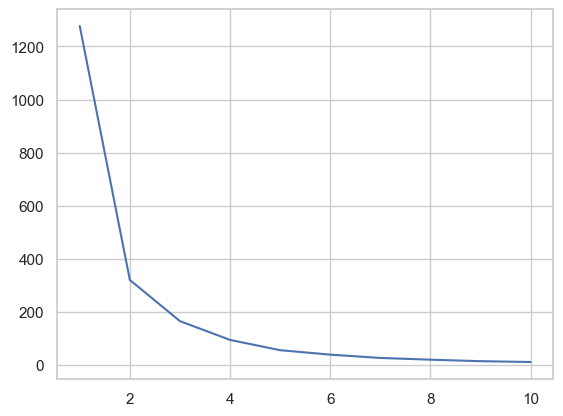

In [142]:
from sklearn.cluster import KMeans

intertia_scores=[]
for i in range(1,11):
    kmeans=KMeans(n_clusters=i)
    kmeans.fit(cf[['Tenure','Complain']])
    intertia_scores.append(kmeans.inertia_)
plt.plot(range(1,11),intertia_scores)

In [143]:
labels=kmeans.fit_predict(x[['Tenure','Complain']])
kmeans=KMeans(n_clusters=3)
kmeans.fit_predict(x[['Tenure','Complain']])


array([1, 1, 1, ..., 2, 1, 0])

In [144]:
final_df['Tenure_Complain_Cluster'] = kmeans.fit_predict(final_df[['Tenure', 'Complain']])


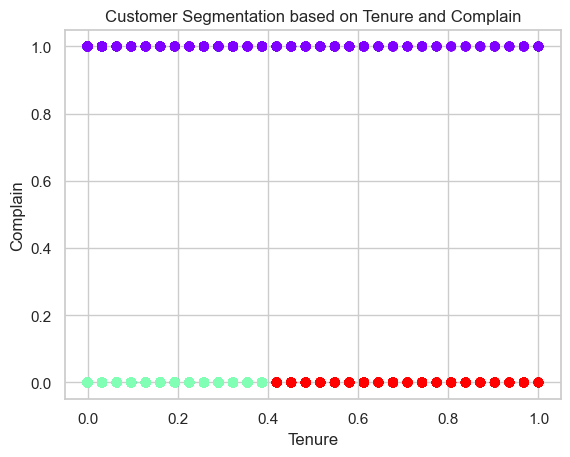

In [145]:
mobile_phone_segment = final_df[final_df['PreferedOrderCat_Mobile Phone'] == 1 ]
plt.scatter(final_df['Tenure'], final_df['Complain'], c=final_df['Tenure_Complain_Cluster'], cmap='rainbow')
plt.xlabel('Tenure')
plt.ylabel('Complain')
plt.title('Customer Segmentation based on Tenure and Complain')
plt.show()

In [146]:
kmeans = KMeans(n_clusters=3)
final_df['Tenure_Complain_Cluster'] = kmeans.fit_predict(final_df[['Tenure', 'Complain']])
mobile_phone_segment = final_df[final_df['PreferedOrderCat_Mobile Phone'] == 1 ]
mobile_phone_segment.head()

,Churn,Tenure,CityTier,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,...,OrderCount,DaySinceLastOrder,CashbackAmount,PreferredLoginDevice_Mobile Phone,PreferredPaymentMode_Debit Card,Gender_Male,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile Phone,MaritalStatus_Married,Tenure_Complain_Cluster
1,1.0,0.290323,0.0,0.096774,0.6,0.6,0.50,0.6,1.0,0.266667,...,0.000000,0.000000,0.303502,1.0,0.0,1.0,0.0,1.0,0.0,1
2,1.0,0.290323,0.0,0.806452,0.4,0.6,0.50,0.5,1.0,0.200000,...,0.000000,0.214286,0.301259,1.0,1.0,1.0,0.0,1.0,0.0,1
4,1.0,0.000000,0.0,0.225806,0.6,0.4,1.00,0.2,0.0,0.000000,...,0.000000,0.214286,0.334973,1.0,0.0,1.0,0.0,1.0,0.0,2
5,1.0,0.000000,0.0,0.548387,0.6,0.8,1.00,0.1,1.0,0.733333,...,0.555556,0.500000,0.369664,0.0,1.0,0.0,0.0,1.0,0.0,1
7,1.0,0.290323,0.0,0.032258,0.6,0.4,0.25,0.2,1.0,0.333333,...,0.111111,0.000000,0.310845,1.0,0.0,1.0,0.0,1.0,0.0,1


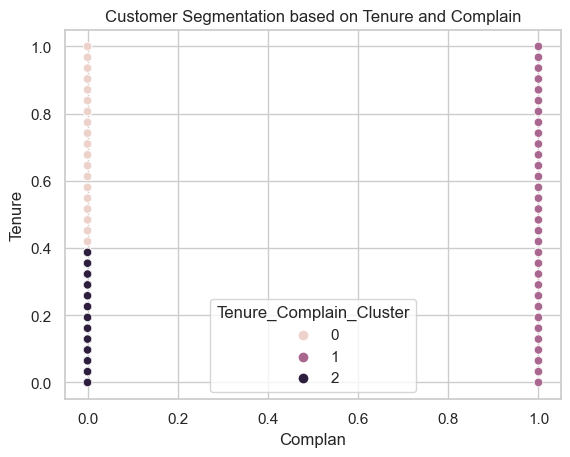

In [147]:
sns.scatterplot(x='Complain', y='Tenure', hue='Tenure_Complain_Cluster', data=final_df)
plt.xlabel('Complan')
plt.ylabel('Tenure')
plt.title('Customer Segmentation based on Tenure and Complain')
plt.show()

In [148]:
electronic_segment = final_df[(final_df['PreferedOrderCat_Mobile Phone'] == 1) | (final_df['PreferedOrderCat_Laptop & Accessory'] == 1)]
electronic_segment.head()

,Churn,Tenure,CityTier,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,...,OrderCount,DaySinceLastOrder,CashbackAmount,PreferredLoginDevice_Mobile Phone,PreferredPaymentMode_Debit Card,Gender_Male,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile Phone,MaritalStatus_Married,Tenure_Complain_Cluster
0,1.0,0.129032,1.0,0.032258,0.6,0.4,0.25,0.8,1.0,0.000000,...,0.0,0.357143,0.444690,1.0,1.0,0.0,1.0,0.0,0.0,1
1,1.0,0.290323,0.0,0.096774,0.6,0.6,0.50,0.6,1.0,0.266667,...,0.0,0.000000,0.303502,1.0,0.0,1.0,0.0,1.0,0.0,1
2,1.0,0.290323,0.0,0.806452,0.4,0.6,0.50,0.5,1.0,0.200000,...,0.0,0.214286,0.301259,1.0,1.0,1.0,0.0,1.0,0.0,1
3,1.0,0.000000,1.0,0.322581,0.4,0.6,1.00,0.7,0.0,0.800000,...,0.0,0.214286,0.351143,1.0,1.0,1.0,1.0,0.0,0.0,2
4,1.0,0.000000,0.0,0.225806,0.6,0.4,1.00,0.2,0.0,0.000000,...,0.0,0.214286,0.334973,1.0,0.0,1.0,0.0,1.0,0.0,2


In [149]:
churn=electronic_segment[electronic_segment['Churn']==1]
churn

,Churn,Tenure,CityTier,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,...,OrderCount,DaySinceLastOrder,CashbackAmount,PreferredLoginDevice_Mobile Phone,PreferredPaymentMode_Debit Card,Gender_Male,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile Phone,MaritalStatus_Married,Tenure_Complain_Cluster
0,1.0,0.129032,1.0,0.032258,0.6,0.4,0.25,0.8,1.0,0.000000,...,0.000000,0.357143,0.444690,1.0,1.0,0.0,1.0,0.0,0.0,1
1,1.0,0.290323,0.0,0.096774,0.6,0.6,0.50,0.6,1.0,0.266667,...,0.000000,0.000000,0.303502,1.0,0.0,1.0,0.0,1.0,0.0,1
2,1.0,0.290323,0.0,0.806452,0.4,0.6,0.50,0.5,1.0,0.200000,...,0.000000,0.214286,0.301259,1.0,1.0,1.0,0.0,1.0,0.0,1
3,1.0,0.000000,1.0,0.322581,0.4,0.6,1.00,0.7,0.0,0.800000,...,0.000000,0.214286,0.351143,1.0,1.0,1.0,1.0,0.0,0.0,2
4,1.0,0.000000,0.0,0.225806,0.6,0.4,1.00,0.2,0.0,0.000000,...,0.000000,0.214286,0.334973,1.0,0.0,1.0,0.0,1.0,0.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5001,1.0,0.032258,1.0,0.838710,0.6,0.2,1.00,0.2,0.0,0.466667,...,0.111111,0.071429,0.357799,0.0,0.0,1.0,0.0,1.0,0.0,2
5003,1.0,0.032258,1.0,0.483871,0.6,0.6,0.50,0.4,1.0,0.066667,...,0.222222,0.214286,0.674794,1.0,0.0,0.0,1.0,0.0,0.0,1
5016,1.0,0.032258,0.0,0.612903,0.6,0.8,0.00,0.6,0.0,0.133333,...,0.111111,0.285714,0.403957,1.0,0.0,1.0,0.0,1.0,1.0,2
5052,1.0,0.032258,0.0,0.096774,0.6,0.6,0.00,1.0,1.0,0.266667,...,0.222222,0.214286,0.491499,1.0,0.0,1.0,0.0,1.0,1.0,1


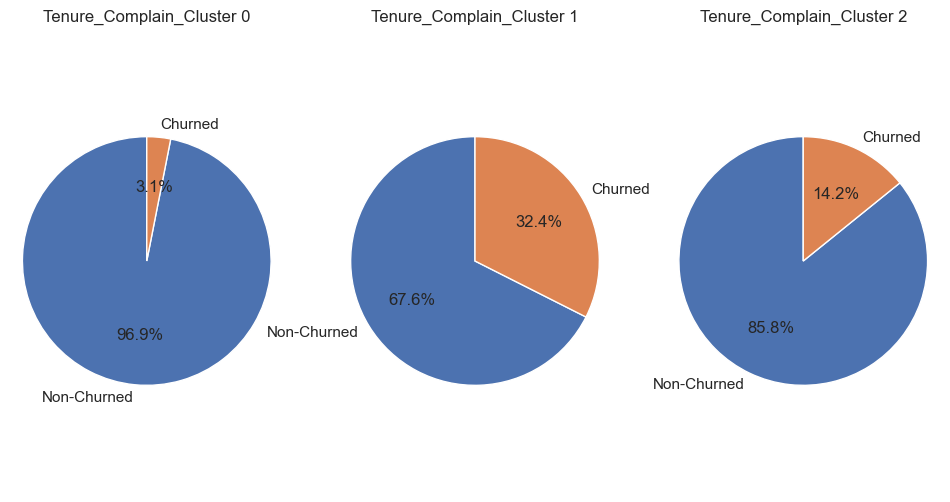

In [150]:
num_clusters = final_df['Tenure_Complain_Cluster'].nunique()

fig, axes = plt.subplots(1, num_clusters, figsize=(12, 6))

for i in range(num_clusters):
    churn_counts = final_df[final_df['Tenure_Complain_Cluster'] == i]['Churn'].value_counts()
    ax = axes[i]
    ax.pie(churn_counts, labels=['Non-Churned', 'Churned'], autopct='%1.1f%%', startangle=90)
    ax.set_title(f'Tenure_Complain_Cluster {i}')
    ax.axis('equal')

In [151]:
cluster2 = final_df[final_df['Tenure_Complain_Cluster'] == 1 ]
cluster2['Complain'].value_counts()

Complain
1.0    1338
Name: count, dtype: int64

In [152]:
final_df.Churn.value_counts()

Churn
0.0    3892
1.0     798
Name: count, dtype: int64

In [153]:
ypred=xgb.predict(xtest)

In [156]:
city_tier_churn = m[
    (m['PreferedOrderCat_Mobile Phone'] == 1) &
    (m['Churn'] == 1) &
    (m['Tenure'].isin([0, 1]))
]['CityTier'].value_counts()


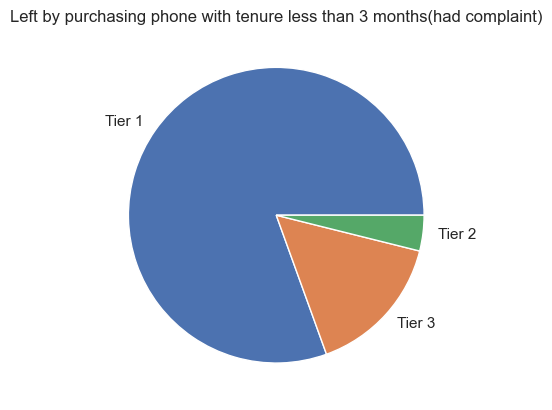

In [157]:
plt.pie(city_tier_churn,labels=['Tier 1', 'Tier 3', 'Tier 2'])
plt.title('Left by purchasing phone with tenure less than 3 months(had complaint)')
plt.show()

In [158]:
m[(m['CityTier']==1) & (m['Churn']==1)]['OrderCount'].value_counts()

OrderCount
0.111111    75
0.000000    50
0.222222    18
0.666667    12
0.777778     8
0.333333     7
1.000000     2
0.555556     2
0.444444     2
Name: count, dtype: int64

In [159]:
np.sort(df.OrderCount.unique())

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.])

In [162]:
xtest['Churn']=ypred
result=xtest
churn_risk=result[(result['Churn']==1)]


In [163]:
churn_risk['CityTier'].value_counts()


CityTier
0.0    113
1.0     94
0.5      6
Name: count, dtype: int64

In [164]:
churn_risk['PreferedOrderCat_Mobile Phone'].value_counts()


PreferedOrderCat_Mobile Phone
1.0    139
0.0     74
Name: count, dtype: int64

In [165]:
churn_risk[(churn_risk['PreferedOrderCat_Mobile Phone']==1)]['Complain'].value_counts()

Complain
1.0    83
0.0    56
Name: count, dtype: int64

In [166]:
churn_risk['Complain'].value_counts()

Complain
1.0    116
0.0     97
Name: count, dtype: int64

In [167]:
churn_risk[(churn_risk['OrderCount']<0.22)]


,Tenure,CityTier,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,PreferredLoginDevice_Mobile Phone,PreferredPaymentMode_Debit Card,Gender_Male,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile Phone,MaritalStatus_Married,Churn
4184,0.032258,0.0,0.322581,0.8,1.0,1.00,0.2,1.0,0.066667,0.142857,0.111111,0.571429,0.394986,1.0,0.0,1.0,0.0,1.0,1.0,1
606,0.000000,0.0,0.290323,0.6,0.6,1.00,0.1,1.0,0.266667,0.000000,0.000000,0.000000,0.321951,1.0,0.0,0.0,0.0,1.0,0.0,1
520,0.000000,1.0,0.032258,0.6,0.6,0.50,0.6,1.0,0.533333,0.000000,0.000000,0.142857,0.329185,1.0,0.0,0.0,0.0,1.0,1.0,1
2559,0.483871,0.0,0.322581,0.6,1.0,0.25,0.3,0.0,0.333333,0.142857,0.111111,0.285714,0.703588,0.0,1.0,1.0,0.0,0.0,0.0,1
911,0.000000,0.0,0.096774,0.6,0.4,0.00,0.6,1.0,0.133333,0.285714,0.111111,0.142857,0.362538,0.0,1.0,1.0,0.0,1.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1,0.290323,0.0,0.096774,0.6,0.6,0.50,0.6,1.0,0.266667,0.000000,0.000000,0.000000,0.303502,1.0,0.0,1.0,0.0,1.0,0.0,1
489,0.000000,0.0,0.290323,0.4,0.6,0.50,0.1,1.0,0.200000,0.000000,0.000000,0.500000,0.313486,0.0,0.0,0.0,0.0,1.0,0.0,1
2551,0.032258,0.0,0.258065,0.8,0.8,0.25,0.2,1.0,0.533333,0.285714,0.111111,0.071429,0.424179,0.0,1.0,0.0,0.0,1.0,0.0,1
3471,0.032258,1.0,0.483871,0.8,0.6,0.75,0.2,0.0,0.200000,0.142857,0.111111,0.071429,0.391875,0.0,1.0,0.0,0.0,1.0,0.0,1


In [168]:
churn_risk[(churn_risk['OrderCount']<0.22)]['Complain'].value_counts()

Complain
1.0    90
0.0    77
Name: count, dtype: int64

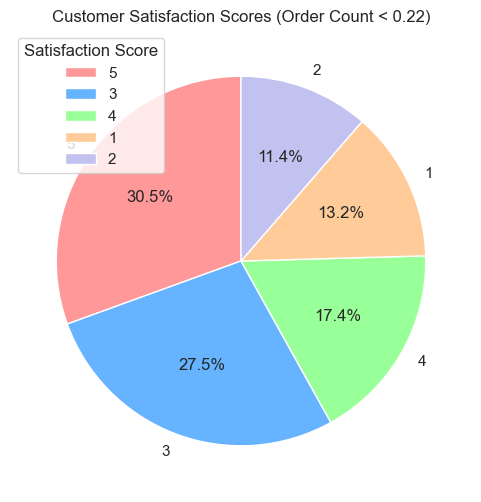

In [174]:
fig, ax = plt.subplots(figsize=(6,6))

satisfaction_counts = churn_risk[churn_risk['OrderCount'] < 0.22]['SatisfactionScore'].value_counts()
labels = [5, 3, 4, 1, 2]
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#c2c2f0']

plt.pie(satisfaction_counts, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
plt.title('Customer Satisfaction Scores (Order Count < 0.22)')
plt.legend(labels, title='Satisfaction Score')
plt.show()


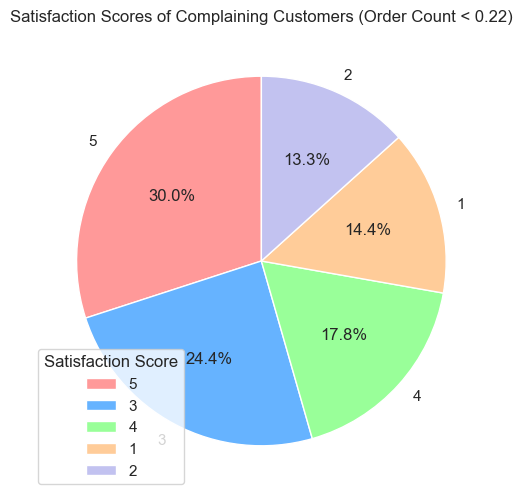

In [170]:
fig, ax = plt.subplots(figsize=(6, 6))

complaining_satisfaction_counts = churn_risk[(churn_risk['OrderCount'] < 0.22) & (churn_risk['Complain'] == 1)]['SatisfactionScore'].value_counts()
labels = [5, 3, 4, 1, 2]
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#c2c2f0']

plt.pie(complaining_satisfaction_counts, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
plt.title('Satisfaction Scores of Complaining Customers (Order Count < 0.22)')
plt.legend(labels, title='Satisfaction Score')
plt.show()


Mostly churned customers are having low tenure(increase cashback offers for new customers)
 according to customer segmentation mostly churned customers are 
     
     low tenure(1-2 mnths)
     order catagory(mobile phone)
     has registerd complaint 
     order count (1,2)
     which is 30% of the total Churn
     city tier 3 contribute close to half of churn in this(has very low order count)
    
    
     still the biggest sale is for mobile phone
     less churn in city tier 2, less sale in city tier 2
     less than average churn in city tier 1(loyal customers)

In the new data set customer at risk churn shows the same pattern

    70% customers risk of churn has order count less than 4
    half have registered complaints
    Mostly customers who purchased mobile phones

Most of the customers are mainly

    - Male
    - Married
    - City tier 1
    - Preffered order catagory : mobile(risk at churn), laptop accessories





# Strategy

    - More cashback option for new customers (customers with more cashback and less tenure are more likely to stay)
    
    - Better customer service (customer with more tenure who have left have registered complaint)
    
    - Quality of Mobile phone (most purchased item is mobile phone,
                                most complaint registered ratio is for mobile phone purchased,
                                customers with longer tenure tend to churn due to this reason
                             so to retain old customers this would be great option)
    
    - Personalised offers for customers with longer tenure and less purchases lately(who have low churn risk)
    
    - In city tier 1, provide mobile-centric promotions and recommendations to improve their satisfaction and loyalty.